<a href="https://colab.research.google.com/github/shlomi-idc/Final_Project/blob/main/MRI_EDA_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
from google.colab import drive
import pandas as pd
from glob import glob
from pathlib import Path
from mpl_toolkits.axes_grid1 import ImageGrid
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
from sklearn.model_selection import train_test_split
import albumentations as A
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data_dir = Path('/content/drive/MyDrive/MRI_segmetnation_project/kaggle_3m')
os.chdir(data_dir)
print(os.getcwd())

/content/drive/MyDrive/MRI_segmetnation_project/kaggle_3m


In [ ]:
file_paths = glob(f'{os.getcwd()}/*/*[0-9].tif')

In [ ]:
csv_path = data_dir/'data.csv'
df = pd.read_csv(csv_path)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [ ]:
df.head(10)

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
5,TCGA_CS_5395,2.0,4.0,2,2.0,NaN,3.0,2,3.0,1.0,1.0,3.0,5.0,2.0,43.0,2.0,NaN,1.0
6,TCGA_CS_5396,3.0,3.0,2,3.0,2.0,2.0,3,3.0,2.0,1.0,3.0,2.0,1.0,53.0,3.0,2.0,0.0
7,TCGA_CS_5397,NaN,4.0,1,2.0,3.0,3.0,2,1.0,2.0,1.0,1.0,6.0,1.0,54.0,3.0,2.0,1.0
8,TCGA_CS_6186,2.0,4.0,1,2.0,1.0,3.0,2,2.0,2.0,1.0,3.0,2.0,2.0,58.0,3.0,2.0,1.0
9,TCGA_CS_6188,2.0,4.0,3,2.0,3.0,3.0,2,1.0,2.0,1.0,3.0,6.0,2.0,48.0,3.0,2.0,0.0


In [ ]:
df.columns

Index(['Patient', 'RNASeqCluster', 'MethylationCluster', 'miRNACluster',
       'CNCluster', 'RPPACluster', 'OncosignCluster', 'COCCluster',
       'histological_type', 'neoplasm_histologic_grade', 'tumor_tissue_site',
       'laterality', 'tumor_location', 'gender', 'age_at_initial_pathologic',
       'race', 'ethnicity', 'death01'],
      dtype='object')

In [ ]:
for column in df.columns:
  print(column)
  if column == 'age_at_initial_pathologic':
    df[column] = df[column].astype('Int64')
  else:
    df[column] = df[column].astype('category')


Patient
RNASeqCluster
MethylationCluster
miRNACluster
CNCluster
RPPACluster
OncosignCluster
COCCluster
histological_type
neoplasm_histologic_grade
tumor_tissue_site
laterality
tumor_location
gender
age_at_initial_pathologic
race
ethnicity
death01


In [ ]:
df.age_at_initial_pathologic


,age_at_initial_pathologic
0,67
1,44
2,37
3,50
4,39
...,...
105,30
106,70
107,36
108,20


In [ ]:
df.describe()

,age_at_initial_pathologic
count,109.0
mean,45.834862
std,13.797151
min,20.0
25%,34.0
50%,47.0
75%,58.0
max,75.0


In [ ]:
df.describe(include=['category'])

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,race,ethnicity,death01
count,110,92.0,109.0,110,108.0,98.0,105.0,110,109.0,109.0,109.0,109.0,109.0,109.0,108.0,102.0,109.0
unique,110,4.0,5.0,4,3.0,4.0,3.0,3,3.0,2.0,1.0,3.0,5.0,2.0,2.0,2.0,2.0
top,TCGA_CS_4941,2.0,5.0,2,1.0,2.0,2.0,1,3.0,2.0,1.0,3.0,2.0,1.0,3.0,2.0,0.0
freq,1,28.0,37.0,62,59.0,31.0,58.0,56,47.0,58.0,109.0,54.0,63.0,56.0,98.0,99.0,82.0


In [ ]:
df.describe()

,age_at_initial_pathologic
count,109.0
mean,45.834862
std,13.797151
min,20.0
25%,34.0
50%,47.0
75%,58.0
max,75.0


<Axes: >

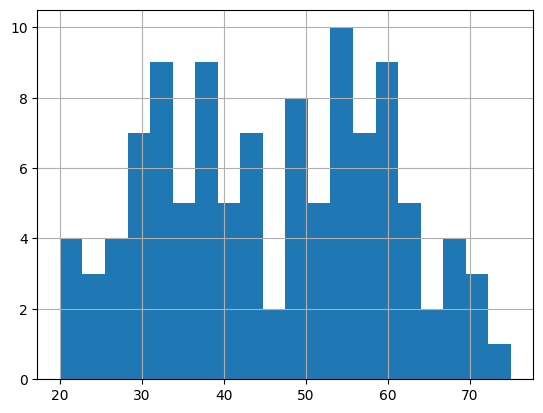

In [ ]:
df.age_at_initial_pathologic.hist(bins=20)

<Axes: >

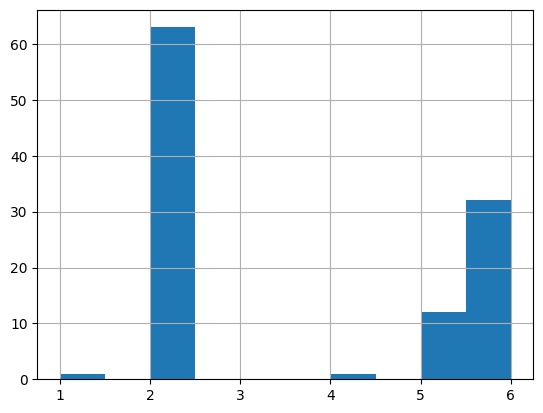

In [ ]:
df.tumor_location.hist()

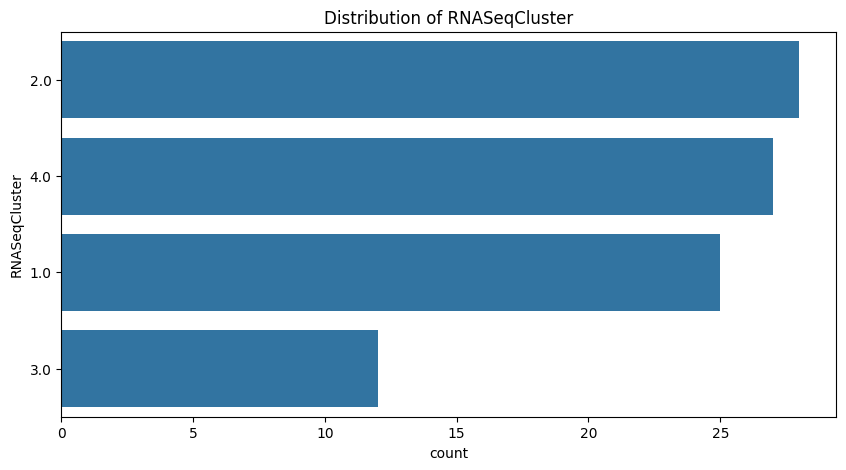

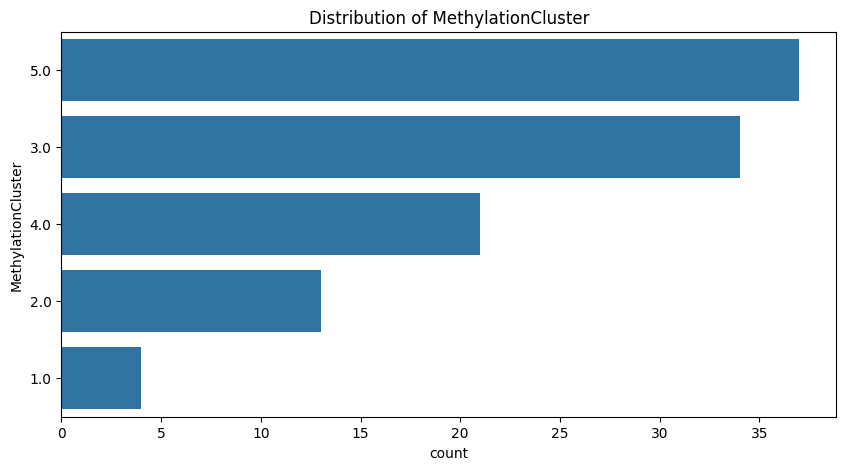

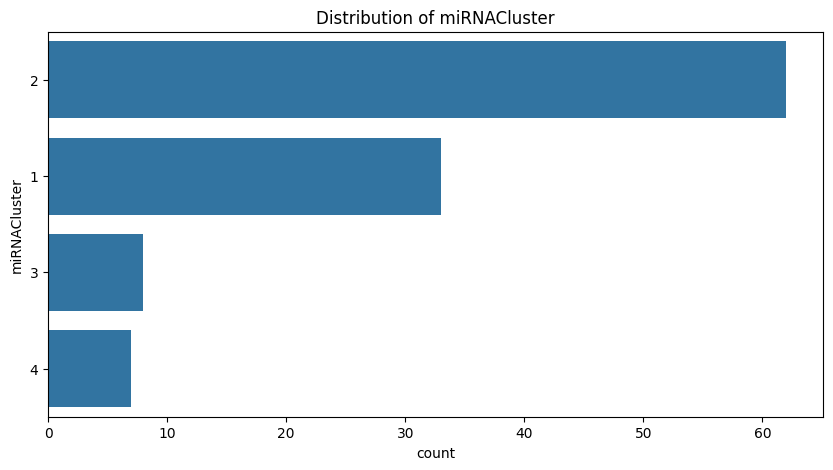

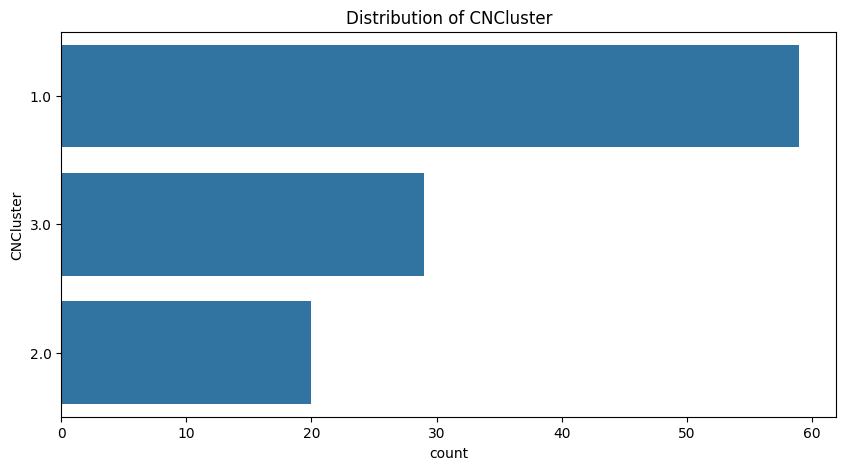

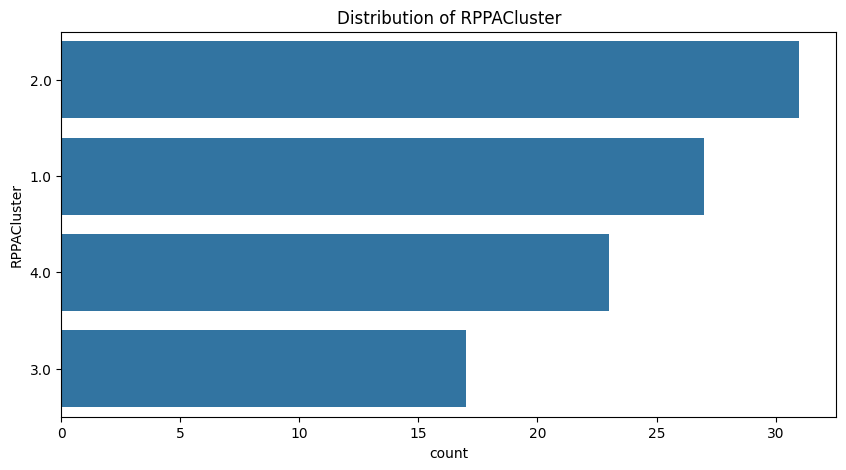

...

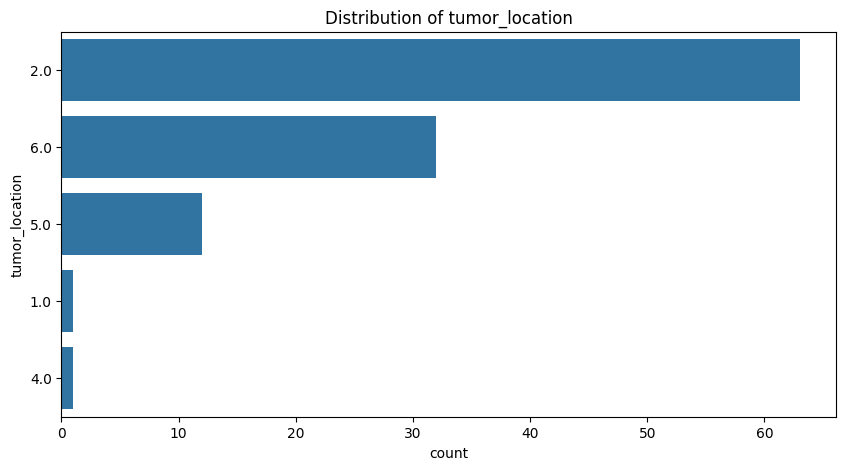

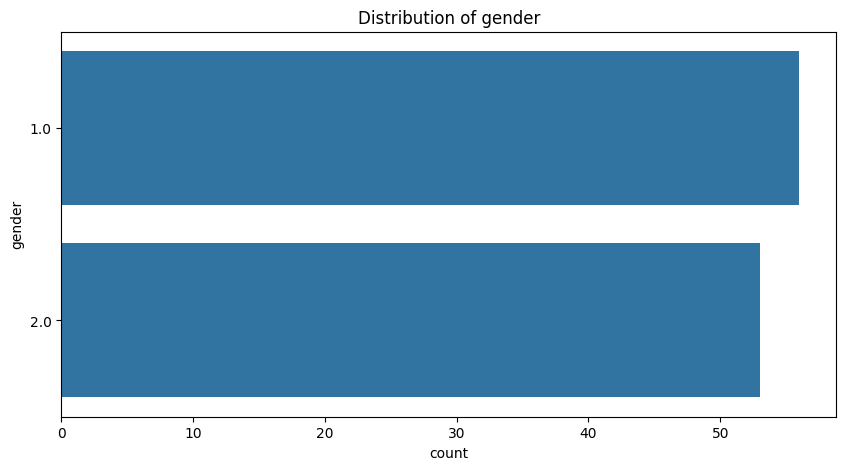

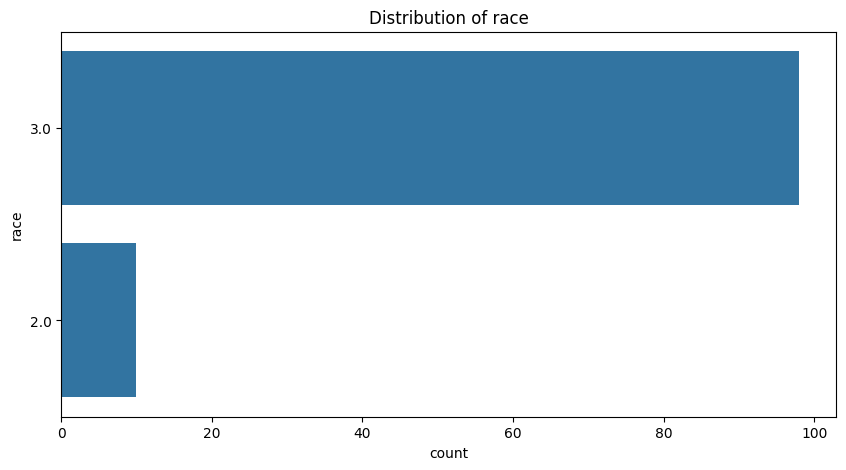

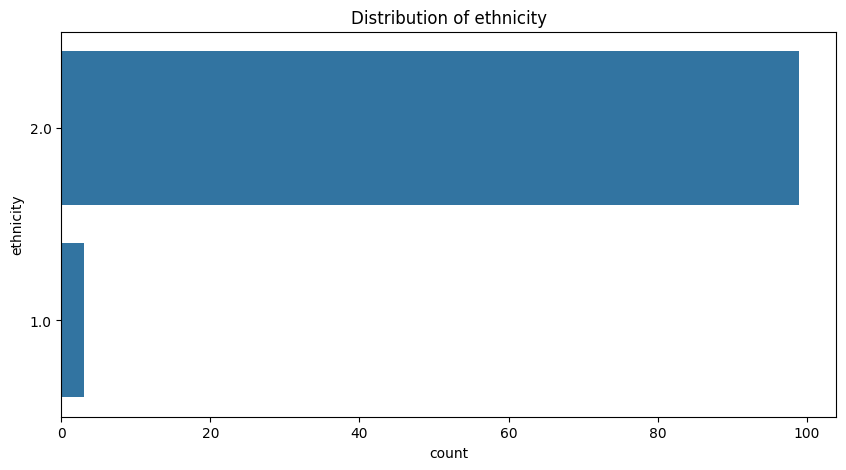

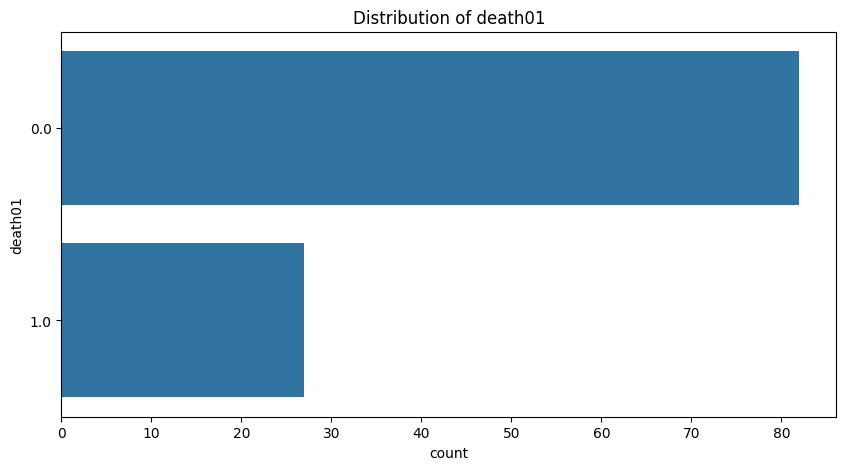

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Count plot for each categorical column
categorical_columns = df.select_dtypes(include=['category']).columns

for column in categorical_columns:
    if column != 'Patient':
      plt.figure(figsize=(10, 5))
      sns.countplot(y=column, data=df, order=df[column].value_counts().index)
      plt.title(f'Distribution of {column}')
      plt.show()


In [ ]:
def get_file_row(path):
    """Produces ID of a patient, image and mask filenames from a particular path"""
    path_no_ext, ext = os.path.splitext(path)
    filename = os.path.basename(path)

    patient_id = '_'.join(filename.split('_')[:3]) # Patient ID in the csv file consists of 3 first filename segments

    return [patient_id, path, f'{path_no_ext}_mask{ext}']

In [ ]:
filenames_df = pd.DataFrame((get_file_row(filename) for filename in file_paths), columns=['Patient', 'image_filename', 'mask_filename'])
filenames_df

,Patient,image_filename,mask_filename
0,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
1,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
4,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
...,...,...,...
3924,TCGA_FG_5964,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3925,TCGA_FG_5964,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3926,TCGA_FG_5964,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3927,TCGA_FG_5964,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...


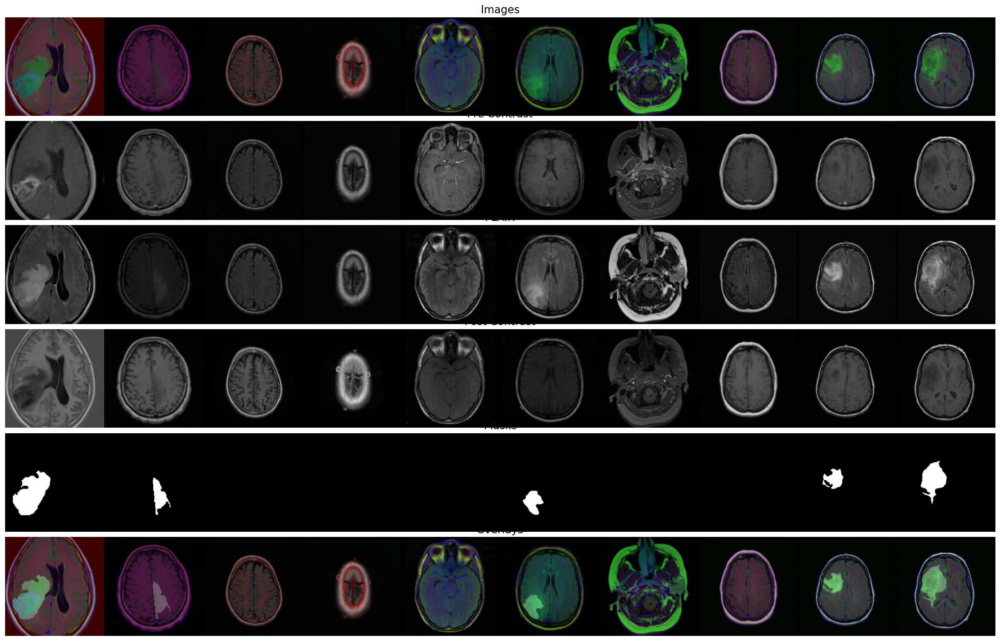

In [ ]:
IMG_SIZE = 512
NUM_SAMPLES = 10

random_sample = filenames_df.sample(n=NUM_SAMPLES, random_state=50)


sample_imgs = []
sample_masks = []
sample_overlays = []
for _, row in random_sample.iterrows():
    img = cv2.resize(cv2.imread(row.image_filename), (IMG_SIZE, IMG_SIZE))
    mask = cv2.resize(cv2.imread(row.mask_filename), (IMG_SIZE, IMG_SIZE))

    # Convert images to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

    sample_imgs.append(img)
    sample_masks.append(mask)

    # Create overlay image
    overlay = cv2.addWeighted(img, 1, mask, 0.2, 0)
    sample_overlays.append(overlay)

# Stack images and masks horizontally
sample_imgs_arr = np.hstack(sample_imgs)
sample_masks_arr = np.hstack(sample_masks)
sample_overlays_arr = np.hstack(sample_overlays)

# Plot
fig = plt.figure(figsize=(25., 25.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(6, 1),  # creates 3x1 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

grid[0].imshow(sample_imgs_arr)
grid[0].set_title("Images", fontsize=15)
grid[0].axis("off")


grid[1].imshow(sample_imgs_arr[:,:,2], cmap='gray')
grid[1].set_title("Pre Contrast", fontsize=15)
grid[1].axis("off")


grid[2].imshow(sample_imgs_arr[:,:,1], cmap='gray')
grid[2].set_title("FLAIR", fontsize=15)
grid[2].axis("off")


grid[3].imshow(sample_imgs_arr[:,:,0], cmap='gray')
grid[3].set_title("Post Contrast", fontsize=15)
grid[3].axis("off")

grid[4].imshow(sample_masks_arr)
grid[4].set_title("Masks", fontsize=15)
grid[4].axis("off")

grid[5].imshow(sample_overlays_arr)
grid[5].set_title("Overlays", fontsize=15)
grid[5].axis("off")

plt.show()


In [ ]:
filenames_df

,Patient,image_filename,mask_filename
0,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
1,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
4,TCGA_HT_7602,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
...,...,...,...
3924,TCGA_FG_5964,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3925,TCGA_FG_5964,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3926,TCGA_FG_5964,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3927,TCGA_FG_5964,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...


In [ ]:
df_planes_number = filenames_df.groupby('Patient')['image_filename'].count().reset_index()

In [ ]:
df_planes_number = df_planes_number.rename(columns = {"image_filename": "number_of_planes"})

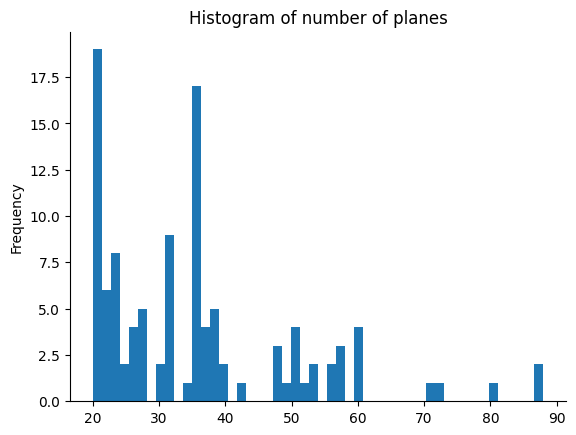

In [ ]:
from matplotlib import pyplot as plt
df_planes_number['number_of_planes'].plot(kind='hist', bins=50, title='Histogram of number of planes')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
df_planes_number['number_of_planes'].value_counts(normalize = True).reset_index().sort_values('proportion', ascending=False)

,number_of_planes,proportion
0,36,0.136364
1,20,0.127273
2,32,0.072727
3,22,0.054545
4,24,0.045455
5,21,0.045455
6,38,0.045455
10,60,0.036364
9,37,0.036364
8,28,0.036364


In [ ]:
df_planes_number['number_of_planes'].describe()

,number_of_planes
count,110.000000
mean,35.718182
std,15.193632
min,20.000000
25%,23.250000
50%,33.000000
75%,39.500000
max,88.000000


In [ ]:
max_value_row = df_planes_number.loc[df_planes_number['number_of_planes'].idxmax()]
patient_max_panes = max_value_row['Patient']

In [ ]:
IMG_SIZE = 512
NUM_SAMPLES = 10

patient_planes = filenames_df[filenames_df['Patient']==patient_max_panes].sort_values(by=['image_filename'], ascending=False)
patient_planes['last_number'] = patient_planes['image_filename'].str.extract(r'(\d+)\.tif$').astype(int)
df_sorted = patient_planes.sort_values(by='last_number')
df_sorted = df_sorted.drop(columns='last_number')
df_sorted

,Patient,image_filename,mask_filename
2641,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2618,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2636,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2598,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2619,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
...,...,...,...
2678,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2681,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2669,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
2682,TCGA_HT_A61A,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...


In [ ]:
from PIL import Image
# Extract the last number (z) from the filename
df_sorted['z'] = df_sorted['image_filename'].str.extract(r'(\d+)\.tif$').astype(int)

In [ ]:
sample_imgs = []

for i, (_, row) in enumerate(df_sorted.iterrows()):
    img = cv2.resize(cv2.imread(row.image_filename), (IMG_SIZE, IMG_SIZE))

    # Convert images to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (88, 88))

    sample_imgs.append(img)

sample_imgs_arr = np.stack(sample_imgs)
sample_imgs_arr.shape


(88, 88, 88, 3)

In [ ]:
import numpy as np
import plotly.graph_objects as go

def visualize_3d_rgb_plotly_with_opacity_optimized(array, filename="3d_plot_with_opacity_optimized.html", opacity_bins=5):
    z_dim, x_dim, y_dim, _ = array.shape

    # Create lists to hold the coordinates and colors for non-zero voxels
    x_coords = []
    y_coords = []
    z_coords = []
    colors = []
    opacities = []

    # Loop through the array and collect the non-zero RGB voxel data
    for i in range(z_dim):
        for j in range(x_dim):
            for k in range(y_dim):
                rgb_color = array[i, j, k]

                # Check if the RGB values are non-zero (i.e., not black)
                if np.any(rgb_color > 0):
                    x_coords.append(j)
                    y_coords.append(k)
                    z_coords.append(i)

                    # Normalize the color to [0, 1] range and convert to hex format
                    colors.append(f'rgb({rgb_color[0]}, {rgb_color[1]}, {rgb_color[2]})')

                    # Calculate perceived brightness (intensity)
                    intensity = 0.299 * rgb_color[0] + 0.587 * rgb_color[1] + 0.114 * rgb_color[2]
                    normalized_intensity = intensity / 255  # Normalize to [0, 1]

                    # Set opacity inversely proportional to intensity (dark pixels more transparent)
                    opacities.append(normalized_intensity)

    # Use bins to reduce the number of opacity levels
    opacities = np.array(opacities)
    binned_opacities = np.digitize(opacities, np.linspace(0, 1, opacity_bins)) / opacity_bins

    # Now create separate traces for each unique opacity bin
    fig = go.Figure()

    # Loop over different opacity bins
    for opacity_value in sorted(set(binned_opacities)):
        # Get the indices for points with this opacity bin
        indices = np.where(binned_opacities == opacity_value)[0]

        # Create a trace for these points
        fig.add_trace(go.Scatter3d(
            x=[x_coords[i] for i in indices],
            y=[y_coords[i] for i in indices],
            z=[z_coords[i] for i in indices],
            mode='markers',
            marker=dict(
                size=5,
                color=[colors[i] for i in indices],  # Set color for each voxel
                opacity=opacity_value  # Set opacity for this group of points
            )
        ))

    # Update layout for better visualization
    fig.update_layout(scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis'),
        width=700,
        margin=dict(r=20, b=10, l=10, t=10))

    # Save the figure to an HTML file
    # fig.write_html(filename)
    fig.show()

# Save the plot to an HTML file
visualize_3d_rgb_plotly_with_opacity_optimized(sample_imgs_arr, "my_3d_plot_with_opacity_optimized.html", opacity_bins=10)


In [ ]:
sample_imgs = []

for i, (_, row) in enumerate(df_sorted.iterrows()):
    img = cv2.resize(cv2.imread(row.image_filename), (IMG_SIZE, IMG_SIZE))

    # Convert images to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (88, 88))

    sample_imgs.append(img)

sample_imgs_arr = np.stack(sample_imgs)
sample_imgs_arr.shape


(88, 88, 88, 3)

In [ ]:
sample_imgs_arr.shape

(88, 88, 88, 3)

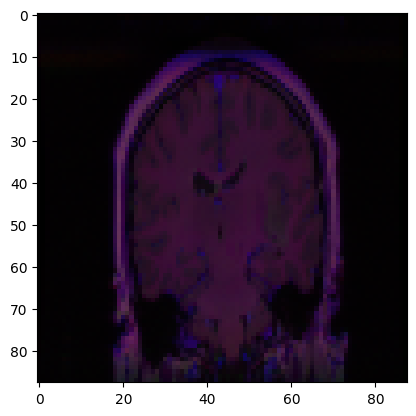

In [ ]:
plt.imshow(sample_imgs_arr[::-1,55,:,...])

In [ ]:
min_value_row = df_planes_number.loc[df_planes_number['number_of_planes'].idxmin()]
patient_min_panes = min_value_row['Patient']
df_planes_number

,Patient,number_of_planes
0,TCGA_CS_4941,23
1,TCGA_CS_4942,20
2,TCGA_CS_4943,20
3,TCGA_CS_4944,20
4,TCGA_CS_5393,20
...,...,...
105,TCGA_HT_8563,23
106,TCGA_HT_A5RC,32
107,TCGA_HT_A616,28
108,TCGA_HT_A61A,88


In [ ]:
df_merge=pd.merge(left=df, right=df_planes_number, on='Patient', how='inner')
len(df_merge)
under_30_planes = df_merge[df_merge['number_of_planes']<30]
under_30_planes.describe(include='all')

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01,number_of_planes
count,44,35.0,43.0,44.0,44.0,37.0,43.0,44.0,44.0,44.0,44.0,44.0,44.0,44.0,44.0,43.0,37.0,44.0,44.000000
unique,44,4.0,5.0,4.0,3.0,4.0,3.0,3.0,3.0,2.0,1.0,3.0,4.0,2.0,<NA>,2.0,2.0,2.0,NaN
top,TCGA_CS_4941,2.0,5.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,<NA>,3.0,2.0,0.0,NaN
freq,1,13.0,18.0,22.0,26.0,13.0,23.0,23.0,20.0,25.0,44.0,21.0,25.0,24.0,<NA>,39.0,36.0,38.0,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.704545,NaN,NaN,NaN,22.704545
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.591211,NaN,NaN,NaN,2.698661
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.0,NaN,NaN,NaN,20.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.0,NaN,NaN,NaN,20.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.0,NaN,NaN,NaN,22.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.75,NaN,NaN,NaN,24.250000


In [ ]:
df_merge=pd.merge(left=df, right=df_planes_number, on='Patient', how='inner')
len(df_merge)
above_60_planes = df_merge[df_merge['number_of_planes']>50]
above_60_planes.describe(include='all')

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01,number_of_planes
count,20,15.0,20.0,20.0,18.0,17.0,16.0,20.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,20.000000
unique,20,4.0,5.0,3.0,3.0,4.0,3.0,3.0,3.0,2.0,1.0,2.0,3.0,2.0,<NA>,2.0,1.0,2.0,NaN
top,TCGA_DU_5872,1.0,3.0,2.0,1.0,2.0,2.0,1.0,3.0,1.0,1.0,3.0,2.0,1.0,<NA>,3.0,2.0,0.0,NaN
freq,1,5.0,8.0,13.0,10.0,9.0,11.0,10.0,14.0,13.0,19.0,10.0,11.0,12.0,<NA>,17.0,19.0,10.0,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.894737,NaN,NaN,NaN,61.800000
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.72293,NaN,NaN,NaN,11.803657
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,NaN,NaN,NaN,51.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.5,NaN,NaN,NaN,53.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.0,NaN,NaN,NaN,58.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.0,NaN,NaN,NaN,62.750000


In [ ]:
import plotly.express as px
fig = px.scatter(df_merge, x='number_of_planes', y='neoplasm_histologic_grade', color='tumor_location', title='Number of planes vs. histological grade') # Show plot
fig.show()

/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:1971: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [ ]:
patient_planes = filenames_df[filenames_df['Patient']==patient_min_panes].sort_values(by=['image_filename'], ascending=False)
patient_planes['last_number'] = patient_planes['image_filename'].str.extract(r'(\d+)\.tif$').astype(int)
df_sorted = patient_planes.sort_values(by='last_number')
df_sorted = df_sorted.drop(columns='last_number')
df_sorted

,Patient,image_filename,mask_filename
3419,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3429,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3431,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3433,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3432,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3434,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3437,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3435,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3436,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...
3418,TCGA_CS_4942,/content/drive/MyDrive/MRI_segmetnation_projec...,/content/drive/MyDrive/MRI_segmetnation_projec...


In [ ]:
sample_imgs = []

for i, (_, row) in enumerate(df_sorted.iterrows()):
    img = cv2.resize(cv2.imread(row.image_filename), (IMG_SIZE, IMG_SIZE))

    # Convert images to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (20, 20))

    sample_imgs.append(img)

sample_imgs_arr = np.stack(sample_imgs)
sample_imgs_arr.shape


(20, 20, 20, 3)

In [ ]:
visualize_3d_rgb_plotly_with_opacity_optimized(sample_imgs_arr, "my_3d_plot_with_opacity_optimized.html", opacity_bins=10)


In [ ]:
df[df['Patient']=='TCGA_CS_4942'] #20 planes

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44,2.0,NaN,1.0


In [ ]:
df[df['Patient']=='TCGA_HT_A61A'] #88 planes

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
108,TCGA_HT_A61A,NaN,5.0,2,NaN,NaN,NaN,1,3.0,1.0,1.0,1.0,6.0,1.0,20,3.0,2.0,0.0
